This notebook opens the MUSE files and plots them "Figures/AllMUSEGalaxies.png".
This notebook also writes the MUSE galaxies and their filenames in ../Data/MUSEdata.csv

The MUSE files have this address: /data/fourier/sun.1608/PHANGS/MUSE/DR2.2/MUSEDAP/copt/

and this one: PHANGS DRIVE -> archive -> MUSE -> DR2.2 -> copt -> MUSEDAP -> fiducial

This notebook also opens the IRAC files and plots them "Figures/AllIRACGalaxies.png".

The IRAC files have this address: PHANGS DRIVE -> scratch -> background_and_convolution_noodles -> background_comps 

Use irac1 and Gauss4 for stellar mass that is 4 arcsecond resolution (Can check B_MAJ in header)

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import matplotlib.pyplot as plt
from astropy.io import fits
import astropy.io.fits as pyfits
import sys, os
# !{sys.executable} -m pip install aplpy
import numpy as np
import aplpy
from astropy.table import Table

In [5]:
PHANGS_table = Table.read("../Data/0.phangs_v1p6.csv")

In [16]:
# Organize MUSE galaxies and their information in MUSE table
# Filenames have following format:
# /data/fourier/sun.1608/PHANGS/MUSE/DR2.2/MUSEDAP/<copt OR 150pc OR 15asec>/<GALAXY>-<RES>_MAPS.fits

galaxies = ["IC5332", "NGC2835", "NGC0628", "NGC3351", "NGC1087", "NGC3627", "NGC1300", "NGC4254", "NGC1365",
            "NGC4303", "NGC1385", "NGC4321", "NGC1433", "NGC4535", "NGC1512", "NGC5068", "NGC1566", "NGC7496",
            "NGC1672"]

natRes = ["0.87", "1.15", "0.92", "1.05", "0.92", "1.05", "0.89", "0.89", "1.15", "0.78", "0.77", "1.16",
          "0.91", "0.56", "1.25", "1.04", "0.80", "0.89", "0.96"]

# Anand 2021
# distances = [9.0,12.2,9.8,10.0,15.9,11.3,19.0,13.1,19.6,17.0,17.2,15.2,18.6,15.8,18.8,5.2,17.7,18.7,19.4]
dists, pas, ras, decs, incls = [],[],[],[],[]


for i in range(len(galaxies)):
    for j in range(len(PHANGS_table)):
        if galaxies[i] == PHANGS_table["galaxy"][j].upper():
            dists.append(PHANGS_table["dist"][j])
            pas.append(PHANGS_table["orient_posang"][j])
            ras.append(PHANGS_table["orient_ra"][j])
            decs.append(PHANGS_table["orient_dec"][j])
            incls.append(PHANGS_table["orient_incl"][j])
print(dists)
print(natRes)
    
fileNamesNat, fileNames150pc, fileNamesHII, filenamesIRAC, SFRcopt, SFR15asec = [],[],[],[],[],[]

for i in range(len(galaxies)):
    beg = "../../GalaxyFiles/MUSELargeFiles/"
    end = "_MAPS.fits"
    
    fileNamesNat.append(beg + 'MUSE2.2_Nat/' + galaxies[i] + "-" + natRes[i] + "asec" + end)
    fileNames150pc.append(beg + "MUSE2.2_150pc/" + galaxies[i] + "-150pc" + end)
    fileNamesHII.append("../Data/HII_reg_masks/" + galaxies[i] + "_nebulae_mask_V2.fits")
    filenamesIRAC.append("../Data/IRAC/" + galaxies[i].lower() + "_irac1_atGauss4.fits")
    SFRcopt.append(beg + 'SFR/copt/' + galaxies[i] + "_sfr.fits")
    SFR15asec.append(beg + 'SFR/15asec/' + galaxies[i] + "_sfr.fits")

#emsellem22
physRes = [45,42,71,62,84,96,83,96,76,73,33,43,69,61,96,59,80,23,104]

MUSEtable = Table({"Galaxy":         galaxies, 
                   "Distance":       dists,
                   "GalRa":         ras,
                   "GalDec":        decs,
                   "PosAng":         pas,
                   "Incl":           incls,
                   "MUSENatRes":     natRes,
                   "MUSEPhysRes":    physRes,
                   "MUSEmapNat":     fileNamesNat,
                   "MUSEmap150pc":   fileNames150pc,
                   "MUSE_HII_reg":  fileNamesHII,
                   "IRAC_files":    filenamesIRAC,
                   "SFRcopt":       SFRcopt,
                   "SFR15asec":     SFR15asec})

MUSEtable.sort("Galaxy")
MUSEtable.write('../Data/0.MUSEdata.csv', overwrite=True)  

MUSEtable


[9.01, 12.22, 9.84, 9.96, 15.85, 11.32, 18.99, 13.1, 19.57, 16.99, 17.22, 15.21, 18.63, 15.77, 18.83, 5.2, 17.69, 18.72, 19.4]
['0.87', '1.15', '0.92', '1.05', '0.92', '1.05', '0.89', '0.89', '1.15', '0.78', '0.77', '1.16', '0.91', '0.56', '1.25', '1.04', '0.80', '0.89', '0.96']


Galaxy,Distance,GalRa,GalDec,PosAng,Incl,MUSENatRes,MUSEPhysRes,MUSEmapNat,MUSEmap150pc,MUSE_HII_reg,IRAC_files,SFRcopt,SFR15asec
str7,float64,float64,float64,float64,float64,str4,int64,str71,str70,str50,str40,str58,str60
IC5332,9.01,353.61453,-36.10108,74.4,26.9,0.87,45,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/IC5332-0.87asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/IC5332-150pc_MAPS.fits,../Data/HII_reg_masks/IC5332_nebulae_mask_V2.fits,../Data/IRAC/ic5332_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/IC5332_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/IC5332_sfr.fits
NGC0628,9.84,24.173855,15.783643,20.7,8.9,0.92,71,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC0628-0.92asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC0628-150pc_MAPS.fits,../Data/HII_reg_masks/NGC0628_nebulae_mask_V2.fits,../Data/IRAC/ngc0628_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC0628_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC0628_sfr.fits
NGC1087,15.85,41.60492,-0.498717,359.1,42.9,0.92,84,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1087-0.92asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1087-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1087_nebulae_mask_V2.fits,../Data/IRAC/ngc1087_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC1087_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC1087_sfr.fits
NGC1300,18.99,49.920815,-19.411114,278.0,31.8,0.89,83,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1300-0.89asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1300-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1300_nebulae_mask_V2.fits,../Data/IRAC/ngc1300_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC1300_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC1300_sfr.fits
NGC1365,19.57,53.40152,-36.140404,201.1,55.4,1.15,76,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1365-1.15asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1365-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1365_nebulae_mask_V2.fits,../Data/IRAC/ngc1365_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC1365_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC1365_sfr.fits
NGC1385,17.22,54.369015,-24.501162,181.3,44.0,0.77,33,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1385-0.77asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1385-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1385_nebulae_mask_V2.fits,../Data/IRAC/ngc1385_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC1385_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC1385_sfr.fits
...,...,...,...,...,...,...,...,...,...,...,...,...,...
NGC3627,11.32,170.06252,12.9915,173.1,57.3,1.05,96,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC3627-1.05asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC3627-150pc_MAPS.fits,../Data/HII_reg_masks/NGC3627_nebulae_mask_V2.fits,../Data/IRAC/ngc3627_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC3627_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC3627_sfr.fits
NGC4254,13.1,184.7068,14.416412,68.1,34.4,0.89,96,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC4254-0.89asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC4254-150pc_MAPS.fits,../Data/HII_reg_masks/NGC4254_nebulae_mask_V2.fits,../Data/IRAC/ngc4254_irac1_atGauss4.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/NGC4254_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/NGC4254_sfr.fits


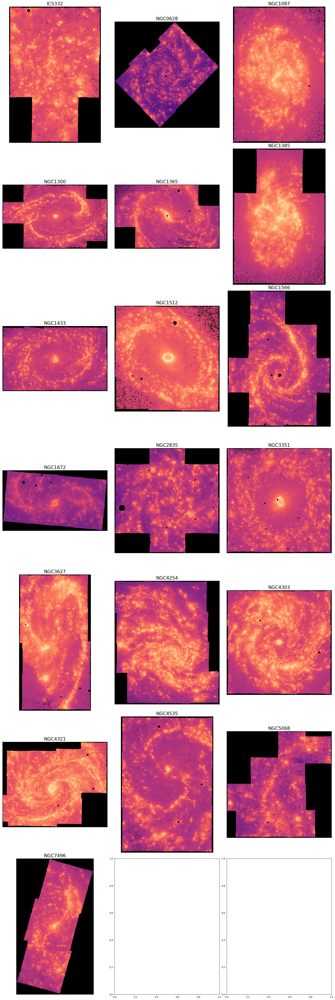

In [7]:
# set up plots & wcs information.
import matplotlib.pyplot as plt
from astropy.wcs import WCS
plots, wcss, hdus = [],[],[]

for i in range(len(MUSEtable)):
#     fileName = MUSEtable["MUSEmapNat"][i]
    fileName = MUSEtable["SFRcopt"][i]
    if os.path.isfile(fileName):
        MUSE_hdu = fits.open(fileName)
        hdus.append(MUSE_hdu)
        MUSE_map = MUSE_hdu["HA_FLUX_CORR"].data
#         MUSE_map = MUSE_hdu["HA6562_FLUX"].data
        plots.append(MUSE_map)
#         wcss.append(WCS(MUSE_hdu["HA6562_FLUX"].header, naxis=2))
        wcss.append(WCS(MUSE_hdu["HA_FLUX_CORR"].header, naxis=2))
    else:
        print("no file: ", fileName)

current_cmap = plt.get_cmap("magma")
current_cmap.set_bad("black")

# make multipanel plot of MUSE galaxies 
import math
i,j,m=0,0,0
PLOTS_PER_ROW = 3
fig, axs = plt.subplots(math.ceil(len(plots)/PLOTS_PER_ROW),PLOTS_PER_ROW, figsize=(20, 60))
for plot in plots:
    logplot = np.log10(plot)
    axs[i][j].imshow(logplot, cmap=current_cmap, aspect="equal", origin = "lower", interpolation = "nearest")
    axs[i][j].set_title(MUSEtable["Galaxy"][m].upper(), fontsize=20)
    axs[i][j].set_xticks([])
    axs[i][j].set_yticks([])
    j+=1
    if j%PLOTS_PER_ROW==0:
        i+=1
        j=0
    m+=1
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
plt.show()
fig.savefig("../Figures/AllMUSEGalaxies.png", dpi=300)
plt.close()



INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
no file:  ../Data/IR

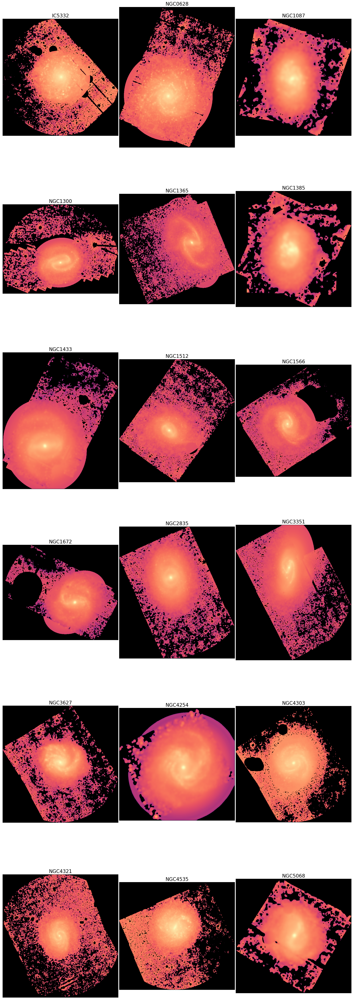

In [8]:
hdus,plots,wcss = [],[],[]

for i in range(len(MUSEtable)):
    fileName = MUSEtable["IRAC_files"][i]
    if os.path.isfile(fileName):
        IRAC_hdu = fits.open(fileName)
        hdus.append(IRAC_hdu)
        IRAC_map = IRAC_hdu[0].data
        plots.append(IRAC_map)
        wcss.append(WCS(IRAC_hdu[0].header, naxis=2))
    else:
        print("no file: ", fileName)

current_cmap = plt.get_cmap("magma")
current_cmap.set_bad("black")

# make multipanel plot of MUSE galaxies 
import math
i,j,m=0,0,0
PLOTS_PER_ROW = 3
fig, axs = plt.subplots(math.ceil(len(plots)/PLOTS_PER_ROW),PLOTS_PER_ROW, figsize=(20, 60))
for plot in plots:
    logplot = np.log10(plot)
    axs[i][j].imshow(logplot, cmap=current_cmap, aspect="equal", origin = "lower", interpolation = "nearest")
    axs[i][j].set_title(MUSEtable["Galaxy"][m].upper(), fontsize=20)
    axs[i][j].set_xticks([])
    axs[i][j].set_yticks([])
    j+=1
    if j%PLOTS_PER_ROW==0:
        i+=1
        j=0
    m+=1
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
plt.show()
fig.savefig("../Figures/AllIRACGalaxies.png", dpi=300)
plt.close()
